#Improving accuracy in estimated joint angles of lower limb for mediapipe

 Medaipipe Pose is not able to give reliable estimation of lower-body keypoints in Sagittal Plane (side view), which hinders a markerless computer vision approach to gait analysis. In this scrit, I attempt to improve mediapipe pose estimation by outlier removal, left/right swap correction, spline interpolation, and k-SVD smoothing. The results are shown in figures of joint angles and overlay videos, from which we observe all of unreasonable values are by and large corrected.

### Inaccurate estimation by mediapipe pose
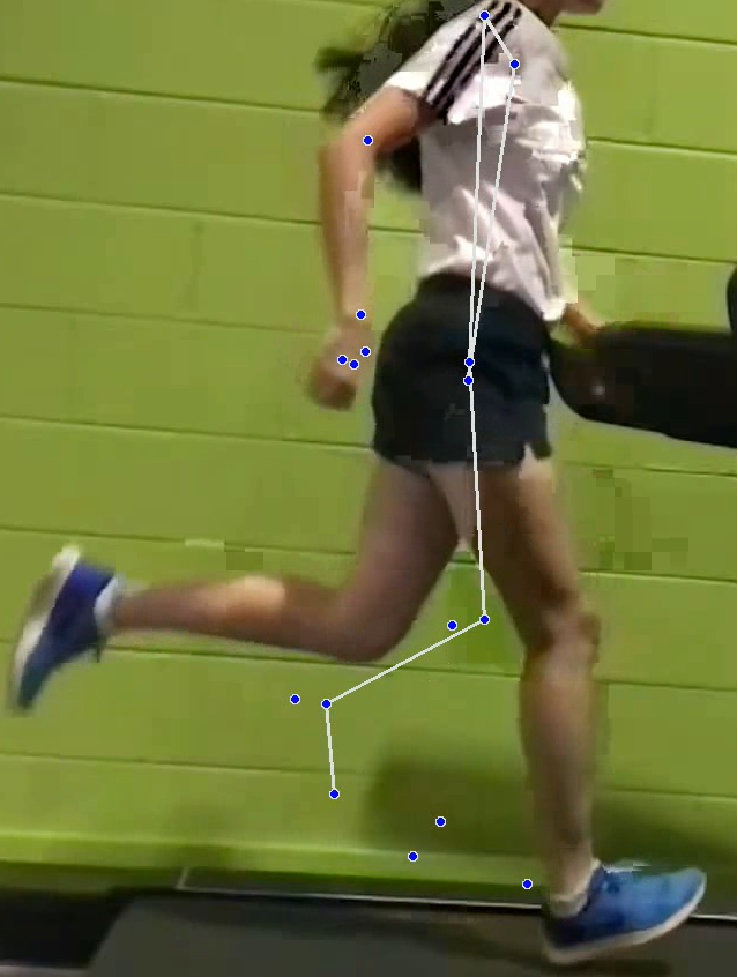

# Install mediapipe (latest version as of July 2022)

In [ ]:

!pip install --upgrade pip
!pip install mediapipe==0.8.10


'\n!pip install --upgrade pip\n!pip install mediapipe==0.8.10\n'

In [ ]:
import numpy as np
import cv2
import tqdm
from mediapipe.python.solutions import drawing_utils as mp_drawing
from mediapipe.python.solutions import pose as mp_pose
from mediapipe.framework.formats import landmark_pb2
import pandas as pd
from scipy.ndimage import maximum_filter, minimum_filter
from scipy import interpolate
from sklearn import linear_model
from matplotlib import pyplot as plt

In [ ]:
%matplotlib inline

In [ ]:
landmark_names = [
        'nose',
        'left_eye_inner', 'left_eye', 'left_eye_outer',
        'right_eye_inner', 'right_eye', 'right_eye_outer',
        'left_ear', 'right_ear',
        'mouth_left', 'mouth_right',
        'Left Shoulder', 'Right Shoulder',
        'left_elbow', 'right_elbow',
        'left_wrist', 'right_wrist',
        'left_pinky_1', 'right_pinky_1',
        'left_index_1', 'right_index_1',
        'left_thumb_2', 'right_thumb_2',
        'Left Hip', 'Right Hip',
        'Left Knee', 'Right Knee',
        'Left Ankle', 'Right Ankle',
        'Left Heel', 'Right Heel',
        'Left Toe', 'Right Toe',
    ]

In [ ]:
tracker_config = {"static_image_mode":True,
               "model_complexity":1,
               "smooth_landmarks":False,
               "enable_segmentation":True,
               "smooth_segmentation":False,
               "min_detection_confidence":0.5,
               "min_tracking_confidence":0.5}

In [ ]:
left_lower_body_features = ["Left Hip X", 
                            "Left Knee X", 
                            "Left Ankle X", 
                            "Left Heel X", 
                            "Left Toe X",
                            "Left Hip Y",
                            "Left Knee Y", 
                            "Left Ankle Y", 
                            "Left Heel Y", 
                            "Left Toe Y"]

right_lower_body_features = ["Right Hip X", 
                            "Right Knee X", 
                            "Right Ankle X", 
                            "Right Heel X", 
                            "Right Toe X",
                            "Right Hip Y",
                            "Right Knee Y", 
                            "Right Ankle Y", 
                            "Right Heel Y", 
                            "Right Toe Y"]

## Helper functions

In [ ]:
def set_direct_info(direct_ind):
  if direct_ind == 1:
    direct_ind = 1
    _direct = "Left"
    direct = "Right"
  else:
    direct_ind = -1
    _direct = "Right"
    direct = "Left"
  return direct, _direct

In [ ]:
def show_image(img, figsize=(10, 10)):
  """Shows output PIL image."""
  plt.figure(figsize=figsize)
  plt.imshow(img)
  plt.show()

In [ ]:
def AngleBetweenVectors(a_x, a_y, b_x, b_y, c_x, c_y, d_x, d_y): 
  ''' 
  angle between vectors (a_x - b_x, a_y - b_y) and (c_x - d_x, c_y - d_y)
  input arguments: pandas columns or 1-D numpy array
  '''
  Vec0 = (a_x - b_x) + 1j * (a_y - b_y)
  Vec1 = (c_x - d_x) + 1j * (c_y - d_y)
  angle_ = np.angle(Vec1 / Vec0, deg=True)
  return angle_

def DistBetweenPoints(a_x, a_y, b_x, b_y):
  '''
  distance between points (a_x, a_y) and (b_x, b_y)
  '''
  vec_0 = (a_x - b_x) + 1j * (a_y - b_y)
  return np.absolute(vec_0), (a_x - b_x), (a_y - b_y)

In [ ]:
class KSVD(object):
    def __init__(self, n_components, max_iter=30, tol=1e-6,
                 n_nonzero_coefs=None):
        """
        Sparse model Y = DX, Y is the sample matrix, use KSVD to dynamically update the dictionary matrix D and sparse matrix X
        :param n_components: the number of atoms in the dictionary (the number of columns in the dictionary)
        :param max_iter: maximum number of iterations
        :param tol: sparse representation result tolerance
        :param n_nonzero_coefs: sparsity
        """
        self.dictionary = None
        self.sparsecode = None
        self.max_iter = max_iter
        self.tol = tol
        self.n_components = n_components
        self.n_nonzero_coefs = n_nonzero_coefs

    def _initialize(self, y):
        """
        Initialize the dictionary matrix
        """
        self.dictionary = np.random.normal(size =(y.shape[0], self.n_components))
        self.dictionary = self.dictionary/np.sqrt(np.sum(self.dictionary**2, axis=0))

    def _update_dict(self, y, d, x):
        """
        The process of using KSVD to update the dictionary
        """
        for i in range(self.n_components):
            index = np.nonzero(x[i, :])[0]
            if len(index) == 0:
                continue
            d[:, i] = 0
            r = (y[:, index] - np.dot(d, x[:, index]))
            u, s, v = np.linalg.svd(r, full_matrices=False)
            d[:, i] = u[:, 0].T
            x[i, index] = s[0] * v[0, :]
        return d, x

    def fit(self, y):
        """
        KSVD iterative process
        """
        self._initialize(y)
        for i in range(self.max_iter):
            x = linear_model.orthogonal_mp(self.dictionary, y, n_nonzero_coefs=self.n_nonzero_coefs)
            e = np.linalg.norm(y - np.dot(self.dictionary, x))/(y.shape[0]*y.shape[1])
            if e < self.tol:
                break
            self._update_dict(y, self.dictionary, x)

        self.sparsecode = linear_model.orthogonal_mp(self.dictionary, y, n_nonzero_coefs=self.n_nonzero_coefs)
        return self.dictionary, self.sparsecode


In [ ]:
def recons_ksvd(z, feature_len = 60, 
                n_components = 100, 
                n_nonzero_coefs = 6, 
                max_iter=5000, 
                tol= 0.05):
  ZZ = np.zeros((feature_len, z.shape[-1] - feature_len + 1))
  for j in range(ZZ.shape[-1]):
    ZZ[:, j] = z[j:j+feature_len]
  #columns_norm = np.linalg.norm(ZZ, axis=0)
  #ZZ = ZZ/columns_norm
  ksvd = KSVD(n_components = n_components, n_nonzero_coefs = n_nonzero_coefs, max_iter=max_iter, tol= tol)
  dictionary, sparsecode = ksvd.fit(ZZ)
  #sparsecode = sparsecode * columns_norm
  ZZ_hat = dictionary.dot(sparsecode)
  z_hat = np.zeros_like(z)
  for k in range(z.shape[0]):
    z_hat[k] = np.mean([ZZ_hat[k -i, i] for i in range(k- min(ZZ_hat.shape[0]-1, k), min(k+1, z.shape[0]- feature_len +1))])
  return z_hat, dictionary, sparsecode


In [ ]:
class Reconstruct:
  def __init__(self, normal_samples, kps_coordinate):
    self.normal_samples = normal_samples
    self.kps_coordinate = kps_coordinate
    self.tck = interpolate.splrep(normal_samples, kps_coordinate)
  def __call__(self, t):
    return interpolate.splev(t, self.tck)

## Generate overlay video either from the result of a mediapipe pose tracker or from an existing csv file of keypoint coordinates

In [ ]:
class PoseVideo:
  def __init__(self, video_path, out_video_path,
               out_kps_csv_path = None,
               tracker_config = tracker_config, 
               show_frame_for_every = 50,             
               ):
    self.video_path = video_path
    self.out_video_path = out_video_path
    self.out_kps_csv_path = out_kps_csv_path

    # Open the video.
    self.video_cap = cv2.VideoCapture(video_path)

    # Get some video parameters to generate output video with classificaiton.
    self.video_n_frames = self.video_cap.get(cv2.CAP_PROP_FRAME_COUNT)
    self.video_fps = self.video_cap.get(cv2.CAP_PROP_FPS)
    self.video_width = int(self.video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    self.video_height = int(self.video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print(f"video_n_frames = {self.video_n_frames}")
    print(f"video_fps = {self.video_fps}")
    print(f"video_width = {self.video_width}")
    print(f"video_height = {self.video_height}")

    self.tracker_config = tracker_config
    self.show_frame_for_every = show_frame_for_every
  
  def save_kps(self, df):
    df.to_csv(self.out_kps_csv_path + '.csv', index=False)

  def __call__(self, df = None):
    if df is None:
      self.mode = "write"
      df = pd.DataFrame(np.zeros((int(self.video_n_frames), 2 * len(landmark_names)+1)),
                                  columns =  [feature + " " + coordinate 
                                              for feature in landmark_names 
                                              for coordinate in ["X", "Y"]] + ["Time"])
      # Initialize tracker.
      pose_tracker = mp_pose.Pose(**self.tracker_config)
    else:
      self.mode = "read"
      df = df.copy(deep=True)
      pose_tracker = None
    
    # Run pose estimation on a video.
    # Open output video.
    out_video = cv2.VideoWriter(self.out_video_path, 
                                cv2.VideoWriter_fourcc(*'mp4v'), 
                                self.video_fps, 
                                (self.video_width, self.video_height)
                                )
    frame_idx = 0
    output_frame = None
    with tqdm.tqdm(total=self.video_n_frames, position=0, leave=True) as pbar:
      while True:
        # Get next frame of the video.
        success, input_frame = self.video_cap.read()
        if not success:
          print("Failed to read the {}-th frame".format(frame_idx))
          if self.mode == "write":
            df.drop(df.index[frame_idx:], inplace=True)
          break

        # Run pose tracker.
        input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)
        '''
        Adjust the orientation of output video according to your own environment 
        ##############################################################################
        input_frame = cv2.rotate(input_frame, cv2.ROTATE_90_CLOCKWISE)  ##############
        input_frame = cv2.rotate(input_frame, cv2.ROTATE_90_CLOCKWISE)  ##############
        ##############################################################################
        '''
        if self.mode == "write":
          result = pose_tracker.process(image=input_frame)
          pose_landmarks = result.pose_landmarks
        elif self.mode == "read":
          pose_landmarks = landmark_pb2.NormalizedLandmarkList(landmark = [{"x": 0, "y":0} for lmk in landmark_names])
        else:
          print("=== unsupported mode! ===")

        # Draw pose prediction.
        output_frame = input_frame.copy()
        my_pose_connections = [(landmark_names.index('Left Shoulder'), landmark_names.index('Right Shoulder')),
                          (landmark_names.index('Left Shoulder'), landmark_names.index('Left Hip')),
                          (landmark_names.index('Right Shoulder'), landmark_names.index('Right Hip')),
                          (landmark_names.index('Left Hip'), landmark_names.index('Right Hip')),
                          (landmark_names.index(direct + " " +'Hip'), 
                          landmark_names.index(direct + " " +'Knee')),
                          (landmark_names.index(direct + " " +'Knee'), 
                          landmark_names.index(direct + " " + 'Ankle')),
                          (landmark_names.index(direct + " " +'Ankle'), 
                          landmark_names.index(direct + " " + 'Toe')),
                          ]
        if self.mode == "read":
          # Get landmarks.
          frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
          for name, lmk in zip(landmark_names, pose_landmarks.landmark):
            lmk.x = df[name + " " + "X"].iloc[frame_idx]/frame_width
            lmk.y = df[name + " " + "Y"].iloc[frame_idx]/frame_height
         
        if pose_landmarks is not None:
          mp_drawing.draw_landmarks(
              image=output_frame,
              landmark_list=pose_landmarks,
              connections=my_pose_connections)
        if self.mode == "write":
          if pose_landmarks is not None:
            # Get landmarks.
            frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
            for name, lmk in zip(landmark_names, pose_landmarks.landmark):
              df[name + " " + "X"].iloc[frame_idx] = lmk.x * frame_width
              df[name + " " + "Y"].iloc[frame_idx] = lmk.y * frame_height
            df["Time"].iloc[frame_idx] = self.video_cap.get(cv2.CAP_PROP_POS_MSEC)/1000   
            pose_landmarks = np.array([[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                                      for lmk in pose_landmarks.landmark], dtype=np.float32)
            assert pose_landmarks.shape == (33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)    
          else:
            for name in landmark_names:
              df[name + " " + "X"].iloc[frame_idx] = np.nan
              df[name + " " + "Y"].iloc[frame_idx] = np.nan
            df["Time"].iloc[frame_idx] = self.video_cap.get(cv2.CAP_PROP_POS_MSEC)
            pose_landmarks = np.empty((33,3))      
            pose_landmarks[:] = np.nan    
            
        # Save the output frame.
        out_video.write(cv2.cvtColor(np.array(output_frame), cv2.COLOR_RGB2BGR))

        # Show intermediate frames of the video to track progress.
        if frame_idx % self.show_frame_for_every == 0:
          show_image(output_frame)

        frame_idx += 1
        pbar.update()
    # Save keypoints (x,y)s to a csv file
    if self.out_kps_csv_path:
      self.save_kps(df) 
    # Close output video.
    out_video.release()

    # Release MediaPipe resources.
    if self.mode == "write":
      pose_tracker.close()

    # Show the last frame of the video.
    if output_frame is not None:
      show_image(output_frame)
    return df    

## Calculate joint angles and biomechanical parameters and save the result to a csv file

In [ ]:
def running_df(direct_ind, direct, _direct, df_kps, ratio = 1):
    df_kps.fillna(method="ffill")
    df_kps.fillna(method="bfill")
    df_ = pd.DataFrame(columns=[direct + " " + "Hip Flexion Angle", 
                                direct + " " + "Knee Flexion Angle", 
                                direct + " " + "Ankle Angle", 
                                direct + " " + "Heel Rise", 
                                'Running Depth', 'Step Length'])

    df_[direct + " " + 'Hip Flexion Angle'] = direct_ind * AngleBetweenVectors(df_kps[direct + " " + "Knee X"], df_kps[direct + " " + "Knee Y"], 
                                                        df_kps[direct + " " + "Hip X"], df_kps[direct + " " + "Hip Y"], 
                                                        0, 1, 0, 0)
    df_[direct + " " + 'Knee Flexion Angle'] = direct_ind * AngleBetweenVectors(df_kps[direct + " " + "Knee X"], df_kps[direct + " " + "Knee Y"], 
                                df_kps[direct + " " + "Hip X"], df_kps[direct + " " + "Hip Y"], 
                                df_kps[direct + " " + "Ankle X"], df_kps[direct + " " + "Ankle Y"], 
                                df_kps[direct + " " + "Knee X"], df_kps[direct + " " + "Knee Y"])
    df_[direct + " " + 'Ankle Angle'] = direct_ind * AngleBetweenVectors(0, 1, 0, 0, 
                                df_kps[direct + " " + "Ankle X"], df_kps[direct + " " + "Ankle Y"], 
                                df_kps[direct + " " + "Knee X"], df_kps[direct + " " + "Knee Y"])
    df_[direct + " " + "Heel Rise"] = (df_kps[direct + " "  + "Toe" + " "  + "Y"] - df_kps[direct + " "  + "Heel" + " "  + "Y"]) * ratio
    df_['Running Depth'] = (df_kps[direct + " " + "Hip Y"] - min(df_kps[direct + " " + "Hip Y"].min(), df_kps[_direct + " " + "Hip Y"].min())) * ratio
    df_['Step Length'] = direct_ind * (df_kps[direct + " " + "Heel X"] - df_kps[_direct + " " + "Heel X"]) * ratio
    return df_

In [ ]:
def save_df(csv_file_path, df, direct_ind):
  if direct_ind == 1:
    direct_ind = 1
    _direct = "Left"
    direct = "Right"
  else:
    direct_ind = -1
    _direct = "Right"
    direct = "Left"
  out_df = running_df(direct_ind, direct, _direct, df)

  for col in [direct + " "  + feature + " " + coordinate for feature in ("Shoulder", "Hip", "Knee", "Ankle", "Heel", "Toe") 
              for coordinate in ("X", "Y") for direct in ("Left", "Right")] + ["Time"]:
    #append the coordinate value of joints
    out_df[col] = df[col]

  out_df.to_csv(csv_file_path + '.csv', index=False)
  return out_df

# Improving Pose Estimation Accuracy 

In [ ]:
class ImprovePoseEst:
  def __init__(self, video_fps,
               playback_speed = 1, 
               thres = 0.9,
               use_ksvd = False, 
               feature_len = 60, 
               n_components = 80,
               n_nonzero_coefs = 5,
               max_iter=200, 
               tol= 0.05):
    self.alter_window_size = int(video_fps *playback_speed/3) + 1
    self.thres = thres
    self.use_ksvd = use_ksvd

    self.feature_len = feature_len
    self.n_components = n_components
    self.n_nonzero_coefs = n_nonzero_coefs 
    self.max_iter = max_iter
    self.tol= tol

  def __call__(self, file_path):
    thres = self.thres
    df = pd.read_csv(file_path)
    x_l_refined, x_r_refined = self.reconst_kps_loc(file_path, thres = thres, use_ksvd = self.use_ksvd)
    df_reconst = df.copy(deep=True)
    for feature in left_lower_body_features:
      df_reconst[feature] = x_l_refined[:, left_lower_body_features.index(feature)]
    for feature in right_lower_body_features:
      df_reconst[feature] = x_r_refined[:, right_lower_body_features.index(feature)]
    return df_reconst

  def get_kps_loc(self, file_path):
    df = pd.read_csv(file_path)
    L = len(df)
    x = [np.zeros((L,10)), np.zeros((L,10))]
    x[0] = np.column_stack([df["Left Hip X"], 
                            df["Left Knee X"], 
                            df["Left Ankle X"],
                            df["Left Heel X"],
                            df["Left Toe X"], 
                            df["Left Hip Y"], 
                            df["Left Knee Y"], 
                            df["Left Ankle Y"],
                            df["Left Heel Y"],
                            df["Left Toe Y"], ])

    x[1] = np.column_stack([df["Right Hip X"], 
                            df["Right Knee X"], 
                            df["Right Ankle X"],
                            df["Right Heel X"],
                            df["Right Toe X"],  
                            df["Right Hip Y"], 
                            df["Right Knee Y"], 
                            df["Right Ankle Y"],
                            df["Right Heel Y"],
                            df["Right Toe Y"], ])
    return x

  def outlier_removal(self, x, thres = 0.9):
    detect_window_size = 5
    # Outlier Detection
    dist_betw_legs = np.linalg.norm(x[0] - x[1], axis = -1)
    deviations = maximum_filter(dist_betw_legs, detect_window_size)- dist_betw_legs
    outliers = deviations > np.quantile(deviations, thres)

    # Get sample indices for normal samples
    normal_samples = np.where(1-outliers)[0]
    return normal_samples

  def get_left_right_swapped_time(self, x, normal_samples, ref_idx = 2):
    x_l = x[0][normal_samples]
    x_r = x[1][normal_samples]

    dist_betw_left_right = np.maximum(x_l[:, ref_idx],x_r[:, ref_idx])- np.minimum(x_l[:, ref_idx],x_r[:, ref_idx])
    alter_time = [0] + [t for t in np.nonzero(dist_betw_left_right -
                                              minimum_filter(dist_betw_left_right, 
                                                             self.alter_window_size)==0)[0] 
                        if t> int(self.alter_window_size/4)] + [len(x_l)]
    x_l_ = np.zeros(len(x_l))
    x_r_ = np.zeros(len(x_r))
    for t_start, t_end in zip(alter_time[:-1], alter_time[1:]):
      upp_envelope = np.maximum(x_l[t_start:t_end, ref_idx],x_r[t_start:t_end, ref_idx])
      low_envelope = np.minimum(x_l[t_start:t_end, ref_idx],x_r[t_start:t_end, ref_idx])
      if np.mod(alter_time.index(t_start), 2):
        x_l_[t_start:t_end] = upp_envelope
        x_r_[t_start:t_end] = low_envelope
      else:
        x_r_[t_start:t_end] = upp_envelope
        x_l_[t_start:t_end] = low_envelope
    if np.linalg.norm(x_r[:, ref_idx]- x_r_) < np.linalg.norm(x_r[:, ref_idx]- x_l_):
      left_right_swapped_time = np.where(x_r[:, ref_idx]- x_r_)[0]
    else:
      left_right_swapped_time = np.where(x_r[:, ref_idx]- x_l_)[0]
    return left_right_swapped_time

  def refine_x_coordinates(self, file_path, thres = 0.9):
    n_x = 5
    x = self.get_kps_loc(file_path)
    normal_samples = self.outlier_removal(x, thres = thres)
    left_right_swapped_time_2 = self.get_left_right_swapped_time(x, normal_samples, ref_idx = 2)
    left_right_swapped_time_1 = self.get_left_right_swapped_time(x, normal_samples, ref_idx = 1)
    x_l = x[0][normal_samples]
    x_r = x[1][normal_samples]
    x_l_refined = np.zeros_like(x_l)
    x_r_refined = np.zeros_like(x_r)

    for t in range(x_l.shape[0]):
      if t in left_right_swapped_time_2:
        x_r_refined[t][2:n_x] = x_l[t][2:n_x]
        x_l_refined[t][2:n_x] = x_r[t][2:n_x]
      else:
        x_l_refined[t][2:n_x] = x_l[t][2:n_x]
        x_r_refined[t][2:n_x] = x_r[t][2:n_x]
    for t in range(x_l.shape[0]):
      if t in left_right_swapped_time_1:
        x_r_refined[t][:2] = x_l[t][:2]
        x_l_refined[t][:2] = x_r[t][:2]
      else:
        x_l_refined[t][:2] = x_l[t][:2]
        x_r_refined[t][:2] = x_r[t][:2]
    return [x_l_refined, x_r_refined], normal_samples

  def refine_y_coordinates(self, file_path, thres = 0.9):
    n_x = 5
    x = self.get_kps_loc(file_path)
    normal_samples = self.outlier_removal(x, thres = thres)
    left_right_swapped_time_7 = self.get_left_right_swapped_time(x, normal_samples, ref_idx = 7)
    left_right_swapped_time_6 = self.get_left_right_swapped_time(x, normal_samples, ref_idx = 6)
    x_l = x[0][normal_samples]
    x_r = x[1][normal_samples]
    x_l_refined = np.zeros_like(x_l)
    x_r_refined = np.zeros_like(x_r)
    
    n_ = 7
    for t in range(x_l.shape[0]):
      if t in left_right_swapped_time_6:
        x_r_refined[t][n_x:n_] = x_l[t][n_x:n_]
        x_l_refined[t][n_x:n_] = x_r[t][n_x:n_]
      else:
        x_l_refined[t][n_x:n_] = x_l[t][n_x:n_]
        x_r_refined[t][n_x:n_] = x_r[t][n_x:n_]
    for t in range(x_l.shape[0]):
      if t in left_right_swapped_time_7:
        x_r_refined[t][n_:] = x_l[t][n_:]
        x_l_refined[t][n_:] = x_r[t][n_:]
      else:
        x_l_refined[t][n_:] = x_l[t][n_:]
        x_r_refined[t][n_:] = x_r[t][n_:]
    return [x_l_refined, x_r_refined], normal_samples

  def refine_pose_estimation(self, file_path, thres = 0.9):
    n_x = 5
    [x_l_refined_x, x_r_refined_x], normal_samples_x = self.refine_x_coordinates(file_path, thres = 0.9)
    [x_l_refined_y, x_r_refined_y], normal_samples_y = self.refine_y_coordinates(file_path, thres = 0.9)
    x_l_refined = np.hstack((x_l_refined_x[:, :n_x] , x_l_refined_y[:, n_x:]))
    x_r_refined = np.hstack((x_r_refined_x[:, :n_x] , x_r_refined_y[:, n_x:]))
    return [x_l_refined, x_r_refined], normal_samples_x

  def reconst_kps_loc(self, file_path, thres = 0.9, use_ksvd = False):
    [x_l_refined, x_r_refined], normal_samples = self.refine_pose_estimation(file_path, thres = thres)
    x = self.get_kps_loc(file_path)
    x_l = np.zeros_like(x[0])
    x_r = np.zeros_like(x[1])
    for idx in range(x_l.shape[1]):
      reconst_l = Reconstruct(normal_samples, x_l_refined[:, idx])
      reconst_r = Reconstruct(normal_samples, x_r_refined[:, idx])
      for t in range(x_l.shape[0]):
        if t < self.alter_window_size or t > x_l.shape[0] - self.alter_window_size:
          x_l[t, idx] = x[0][t, idx]
          x_r[t, idx] = x[1][t, idx]
        else:
          x_l[t, idx] = reconst_l(t)
          x_r[t, idx] = reconst_r(t)
    if use_ksvd:
      x_l_ = np.zeros_like(x[0])
      x_r_ = np.zeros_like(x[1])
      for idx in range(x_l.shape[1]):
        x_l_[:, idx], dictionary_l, sparsecode_l = recons_ksvd(x_l[:, idx], 
                                                               n_components = self.n_components, 
                                                               n_nonzero_coefs = self.n_nonzero_coefs, 
                                                               max_iter=self.max_iter, 
                                                               tol= self.tol
                                                               )
        x_r_[:, idx], dictionary_r, sparsecode_r = recons_ksvd(x_r[:, idx],
                                                               n_components = self.n_components, 
                                                               n_nonzero_coefs = self.n_nonzero_coefs, 
                                                               max_iter=self.max_iter, 
                                                               tol= self.tol
                                                               )
      x_l = x_l_
      x_r = x_r_
    return x_l, x_r

# Test the script with a Youtube video
## Note: 


*   for slow motion video, playback_speed = 2, while for normal video, playback_speed  = 1
*   If right leg is closer to the camera than left leg, then set direct_ind = 1, otherwise, set direct_ind = -1 

Downloading...
From: https://drive.google.com/uc?id=1-1CA4lCSHBLS9he2n5NvbspLl-QUkU0P
To: /content/bs6ccuG3H5U.mp4
100%|██████████| 8.21M/8.21M [00:00<00:00, 139MB/s]


video_n_frames = 941.0
video_fps = 30.031595408559483
video_width = 1920
video_height = 1080


  0%|          | 0/941.0 [00:00<?, ?it/s]

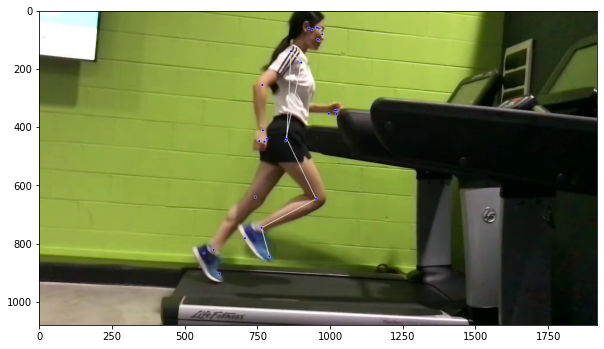

  5%|▌         | 50/941.0 [00:07<02:06,  7.05it/s]

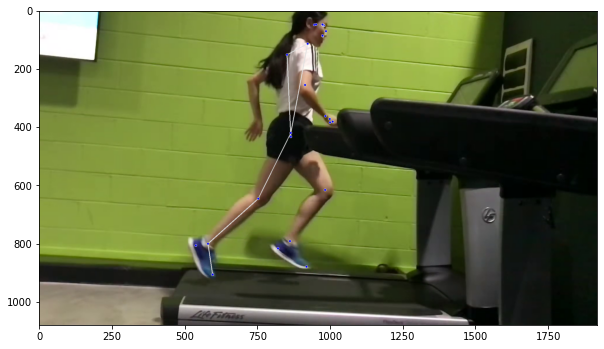

 11%|█         | 100/941.0 [00:15<01:58,  7.11it/s]

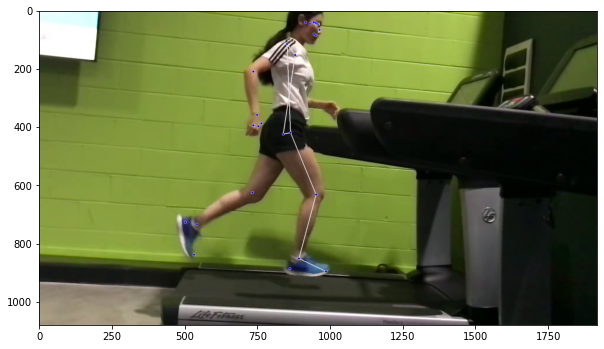

 16%|█▌        | 150/941.0 [00:22<01:51,  7.08it/s]

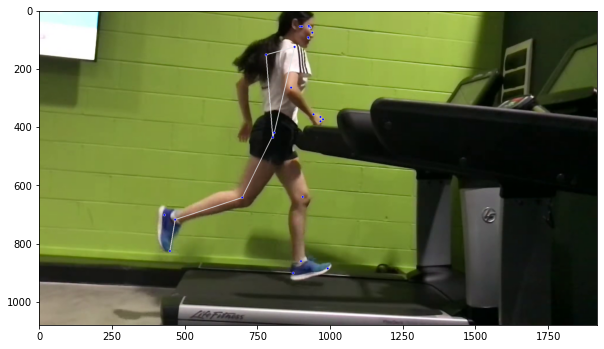

 21%|██▏       | 200/941.0 [00:30<01:43,  7.18it/s]

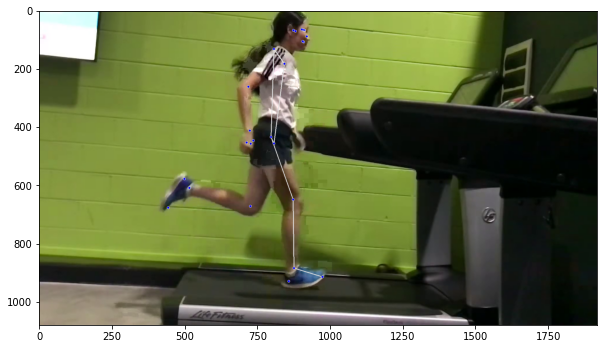

 27%|██▋       | 250/941.0 [00:37<01:42,  6.75it/s]

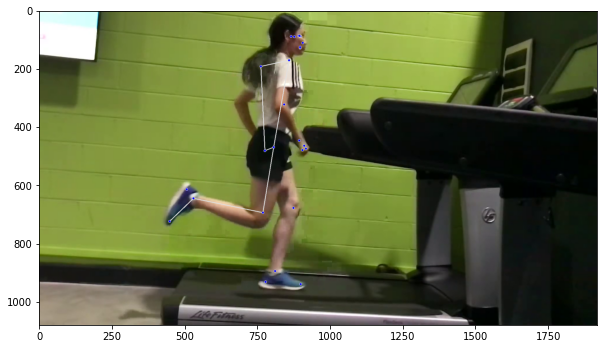

 32%|███▏      | 300/941.0 [00:47<01:31,  7.04it/s]

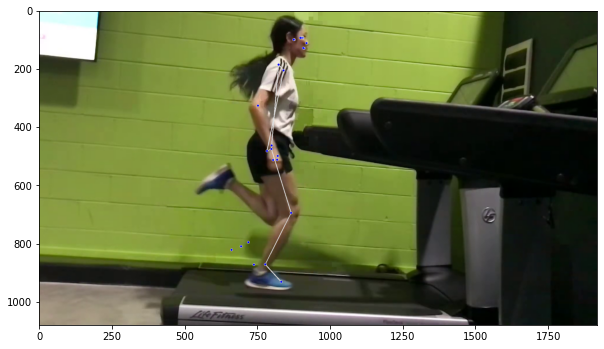

 37%|███▋      | 350/941.0 [00:55<01:26,  6.87it/s]

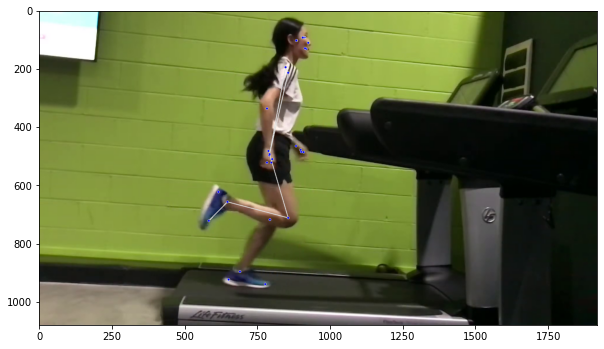

 43%|████▎     | 400/941.0 [01:02<01:18,  6.87it/s]

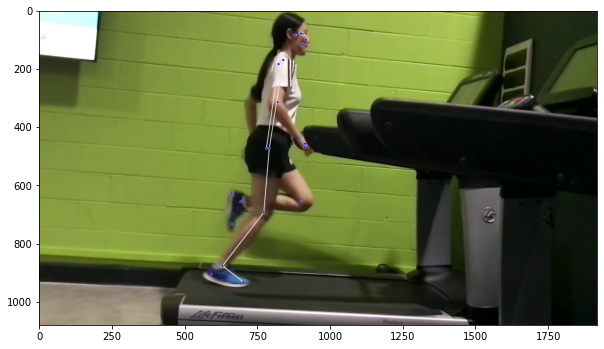

 48%|████▊     | 450/941.0 [01:10<01:14,  6.59it/s]

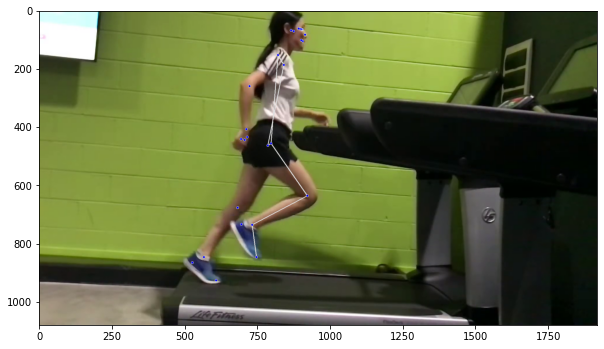

 53%|█████▎    | 500/941.0 [01:19<01:36,  4.55it/s]

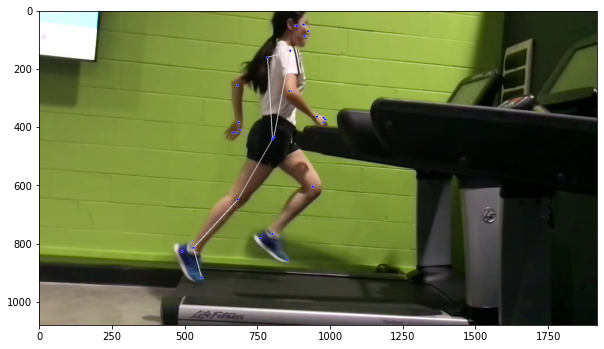

 58%|█████▊    | 550/941.0 [01:27<00:57,  6.85it/s]

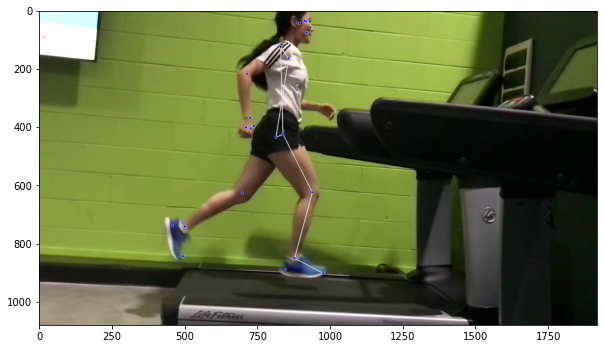

 64%|██████▍   | 600/941.0 [01:35<00:51,  6.69it/s]

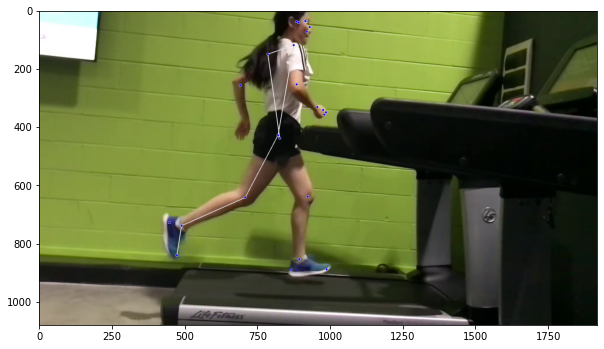

 69%|██████▉   | 650/941.0 [01:43<00:43,  6.61it/s]

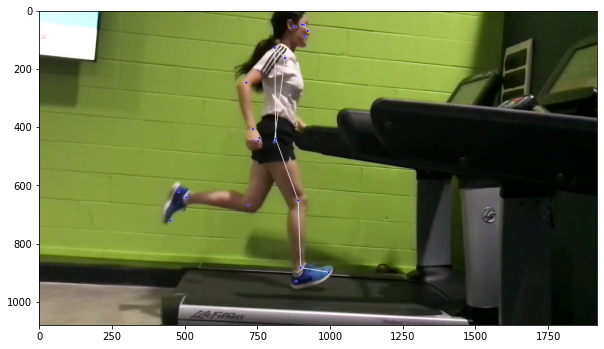

 74%|███████▍  | 700/941.0 [01:51<00:35,  6.74it/s]

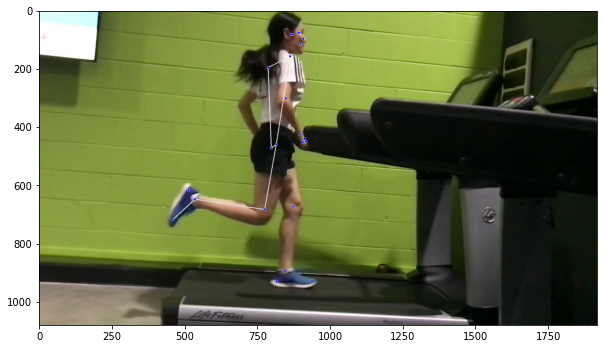

 80%|███████▉  | 750/941.0 [01:59<00:29,  6.53it/s]

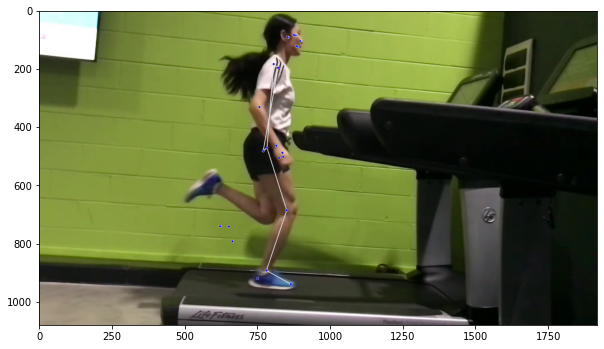

 85%|████████▌ | 800/941.0 [02:07<00:21,  6.61it/s]

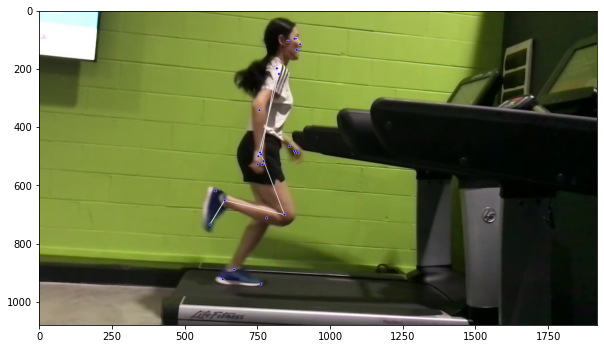

 90%|█████████ | 850/941.0 [02:16<00:14,  6.33it/s]

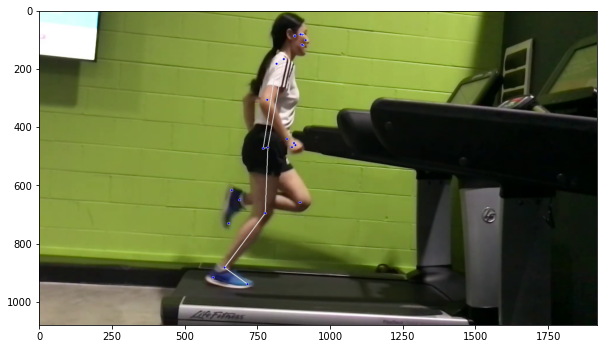

 96%|█████████▌| 900/941.0 [02:27<00:12,  3.32it/s]

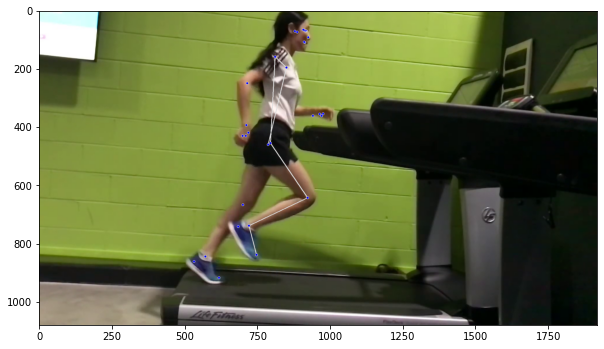

100%|██████████| 941/941.0 [02:41<00:00,  5.82it/s]


Failed to read the 941-th frame


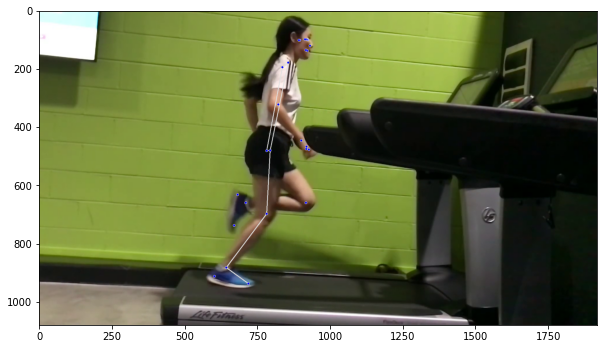

 n_components = 80
 self.n_components = (80,)
video_n_frames = 941.0
video_fps = 30.031595408559483
video_width = 1920
video_height = 1080


  0%|          | 0/941.0 [00:00<?, ?it/s]

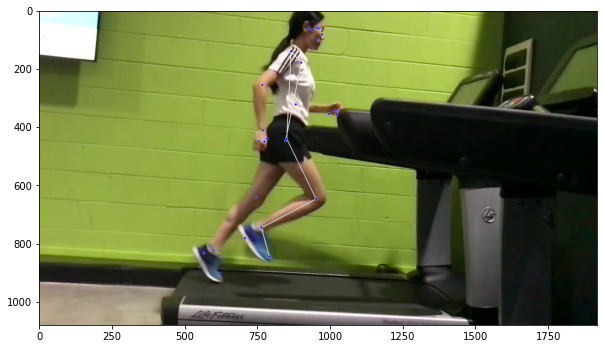

  5%|▌         | 50/941.0 [00:02<00:35, 25.11it/s]

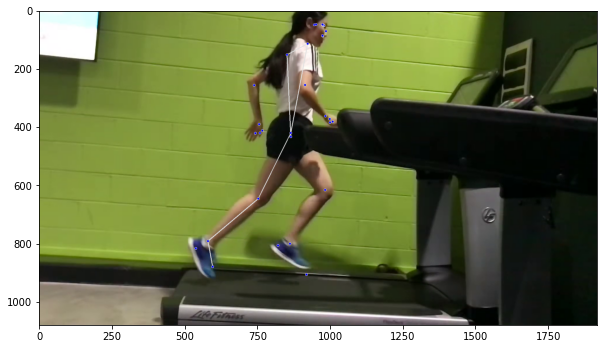

 10%|█         | 98/941.0 [00:04<00:33, 25.43it/s]

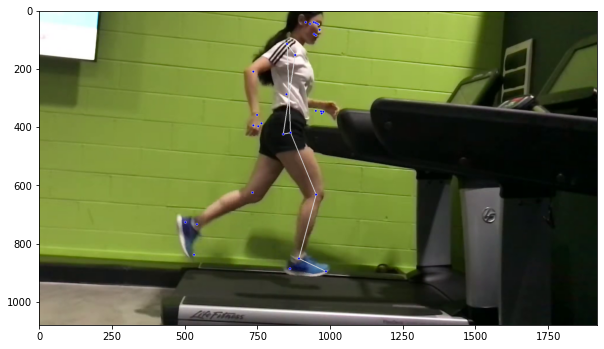

 16%|█▌        | 149/941.0 [00:07<00:31, 25.29it/s]

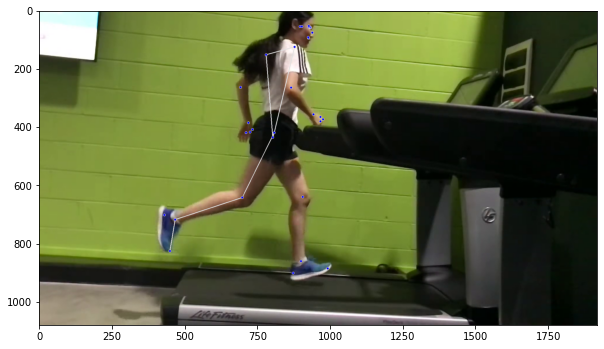

 21%|██▏       | 200/941.0 [00:10<00:29, 25.17it/s]

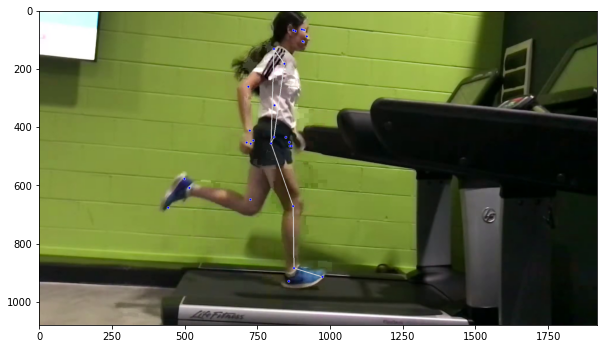

 26%|██▋       | 248/941.0 [00:12<00:27, 25.50it/s]

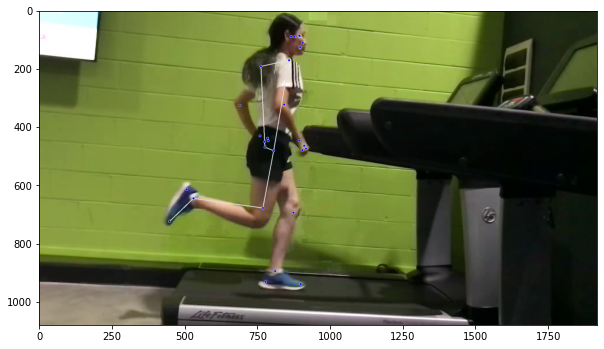

 32%|███▏      | 298/941.0 [00:15<00:25, 24.91it/s]

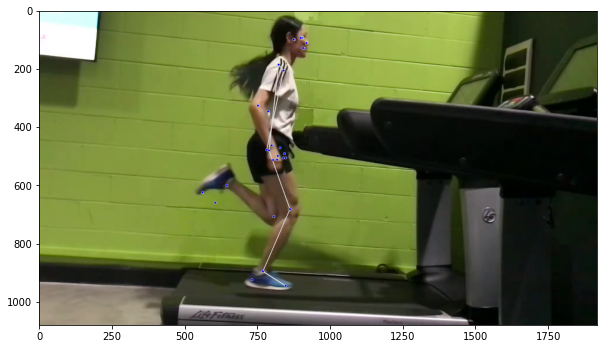

 37%|███▋      | 349/941.0 [00:17<00:24, 24.55it/s]

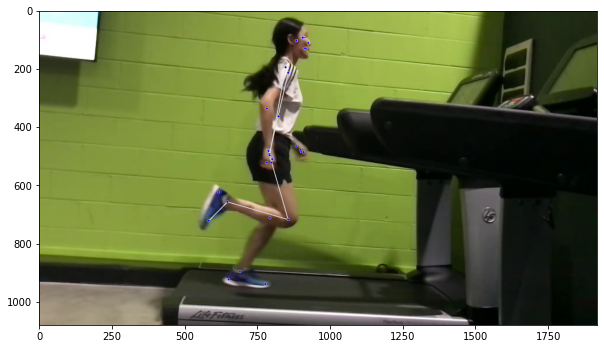

 42%|████▏     | 399/941.0 [00:20<00:22, 24.55it/s]

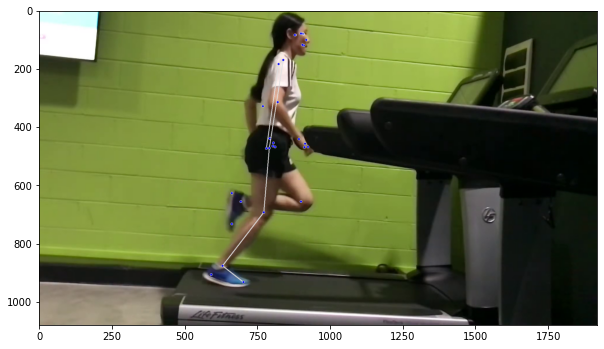

 48%|████▊     | 450/941.0 [00:22<00:20, 24.04it/s]

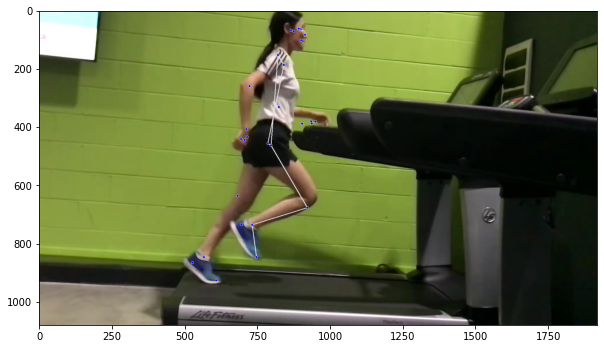

 53%|█████▎    | 498/941.0 [00:25<00:18, 23.60it/s]

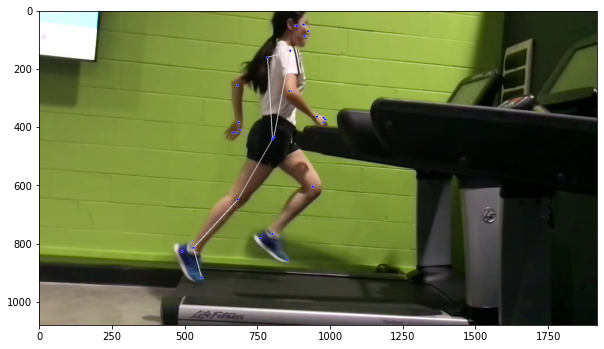

 58%|█████▊    | 550/941.0 [00:28<00:23, 16.83it/s]

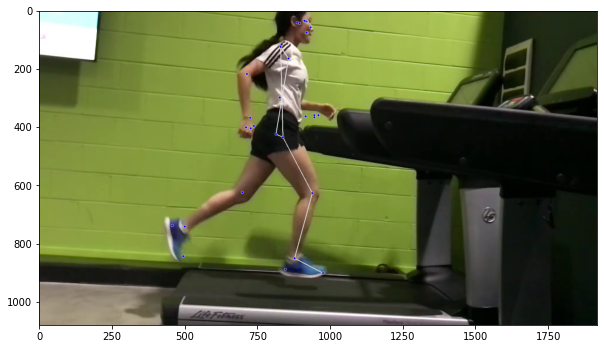

 64%|██████▎   | 598/941.0 [00:31<00:16, 21.23it/s]

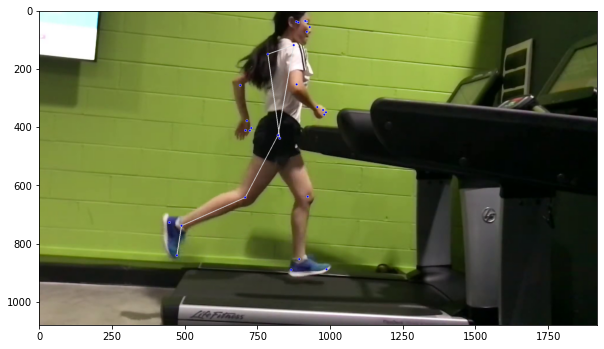

 69%|██████▉   | 650/941.0 [00:34<00:12, 23.39it/s]

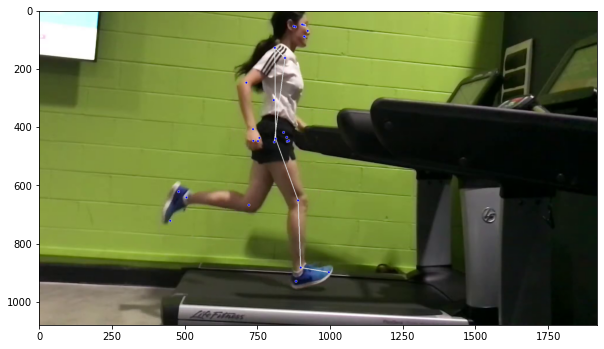

 74%|███████▍  | 698/941.0 [00:37<00:10, 22.82it/s]

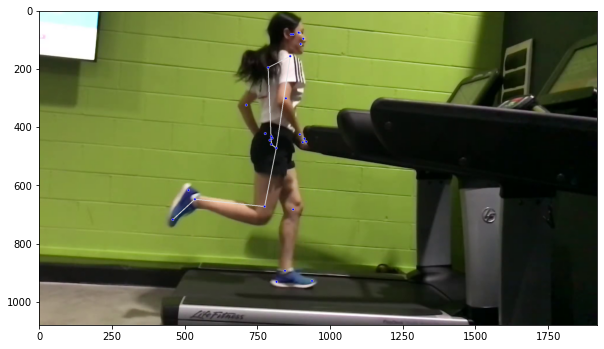

 80%|███████▉  | 750/941.0 [00:40<00:08, 22.69it/s]

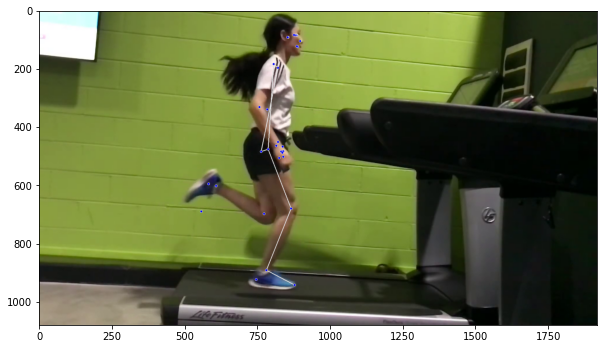

 85%|████████▍ | 798/941.0 [00:43<00:06, 22.58it/s]

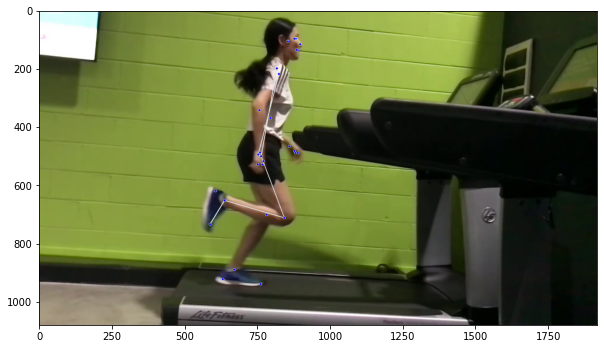

 90%|█████████ | 848/941.0 [00:45<00:04, 21.28it/s]

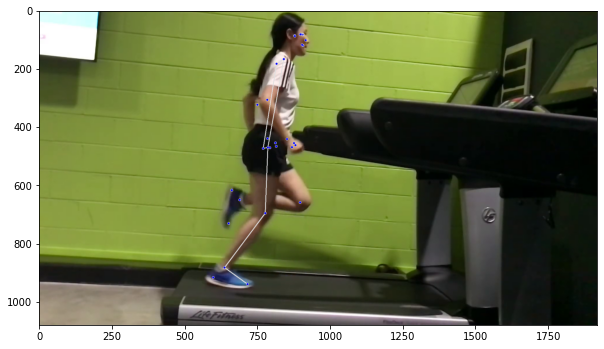

 96%|█████████▌| 899/941.0 [00:48<00:02, 19.20it/s]

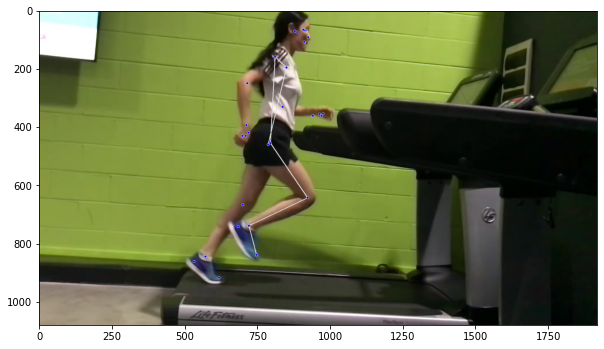

100%|██████████| 941/941.0 [00:51<00:00, 18.19it/s]


Failed to read the 941-th frame


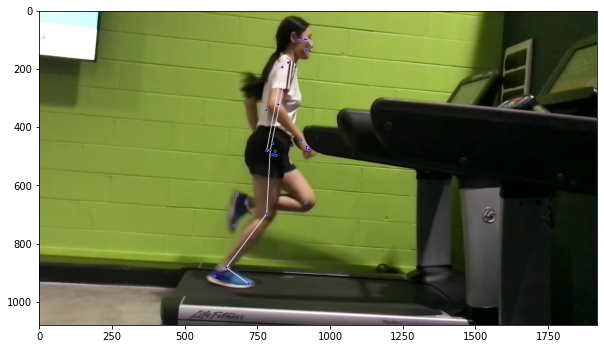

In [ ]:
if __name__ == '__main__':
  # If use_ksvd = True, it will use k-SVD algorithm to reproduce smooth estimated values, 
  # however, a considrable execution time, e.g., 17 minutes on Colab, is required.
  use_ksvd = False

  video_name = "bs6ccuG3H5U"
  id = "1-1CA4lCSHBLS9he2n5NvbspLl-QUkU0P"
  video_path = video_name + ".mp4"
  import gdown
  gdown.download(id=id, output=video_path, quiet=False)

  # For slow motion video, playback_speed = 2, while for normal video, playback_speed  = 1
  playback_speed = 2

  out_video_path = video_name + '_orig.mp4'
  out_kps_csv_path = video_name + '_kps'
  direct_ind = 1
  direct, _direct = set_direct_info(direct_ind)

  orig_model = PoseVideo(video_path, 
                        out_video_path, out_kps_csv_path = out_kps_csv_path,
                        tracker_config = tracker_config)
  df = orig_model()
  csv_file_path = video_path[:-4] + "_" + direct
  out_df = save_df(csv_file_path, df, direct_ind = direct_ind)

  video_fps = orig_model.video_fps
  improve_pose = ImprovePoseEst(video_fps, 
                                playback_speed = playback_speed, 
                                use_ksvd = use_ksvd, 
                                thres = 0.9)
  df_reconst = improve_pose(out_kps_csv_path + ".csv")

  reconst_csv_file_path = video_path[:-4] + "_improved_" + direct
  out_reconst_df = save_df(reconst_csv_file_path, df_reconst, direct_ind = direct_ind)

  out_improved_video_path = video_name + '_improved.mp4'
  improved_model = PoseVideo(video_path, out_improved_video_path, tracker_config = None)
  _ = improved_model(df_reconst)

# Optional: Smoothing estimated values by k-SVD algorithm
## Set use_ksvd = True in the following cell

video_n_frames = 941.0
video_fps = 30.031595408559483
video_width = 1920
video_height = 1080


  0%|          | 0/941.0 [00:00<?, ?it/s]

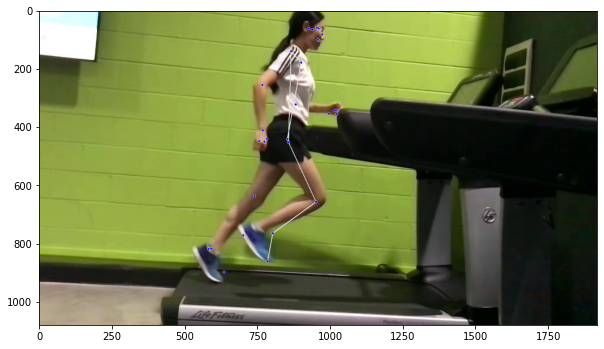

  5%|▌         | 50/941.0 [00:02<00:26, 33.07it/s]

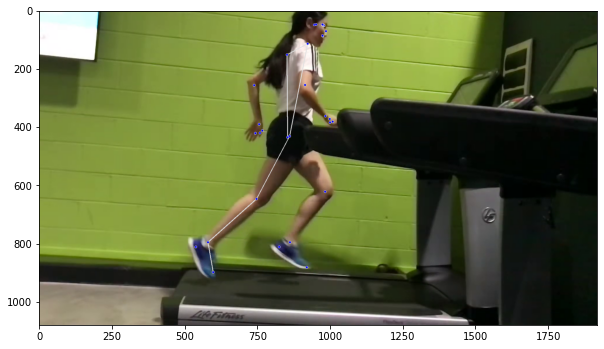

 10%|█         | 97/941.0 [00:03<00:24, 33.93it/s]

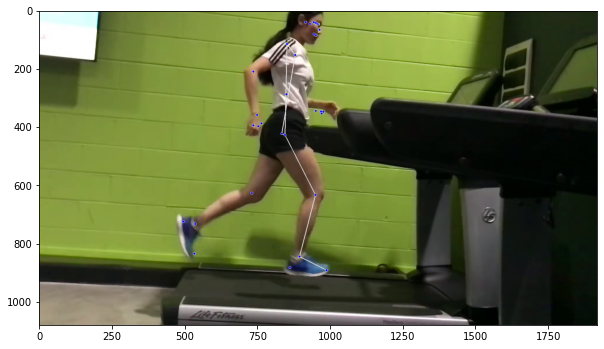

 16%|█▌        | 150/941.0 [00:06<00:25, 31.18it/s]

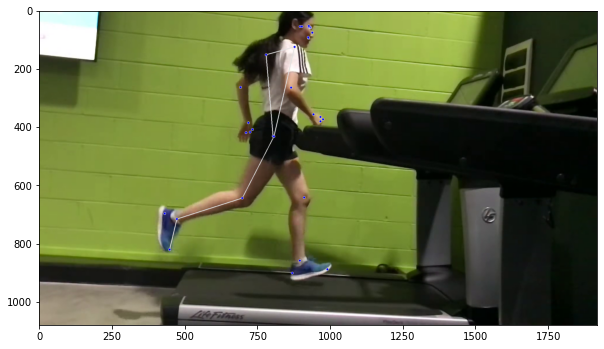

 21%|██▏       | 200/941.0 [00:08<00:23, 31.38it/s]

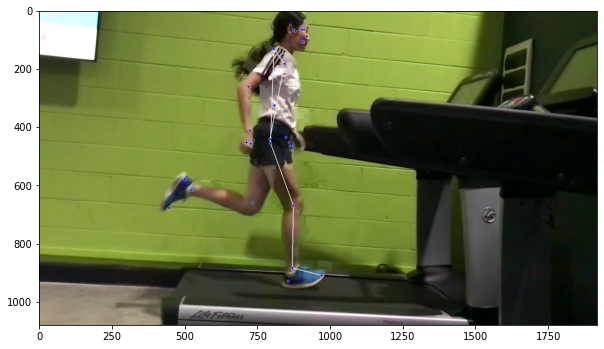

 27%|██▋       | 250/941.0 [00:10<00:21, 32.23it/s]

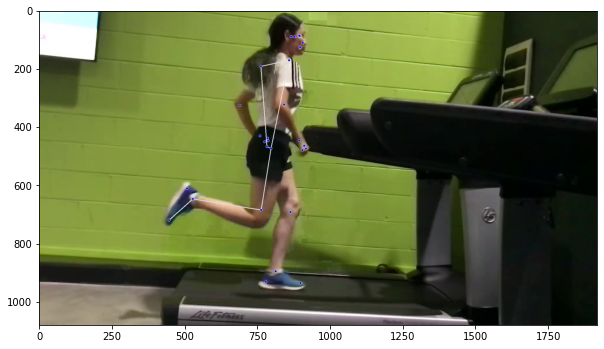

 32%|███▏      | 299/941.0 [00:12<00:20, 31.81it/s]

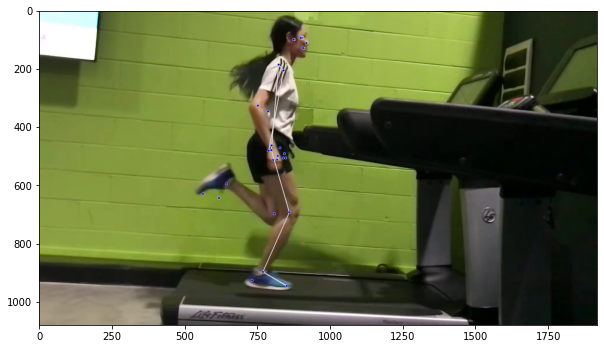

 37%|███▋      | 349/941.0 [00:14<00:18, 31.57it/s]

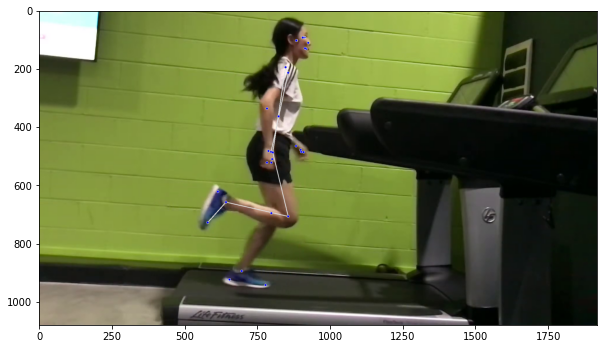

 42%|████▏     | 398/941.0 [00:16<00:17, 31.82it/s]

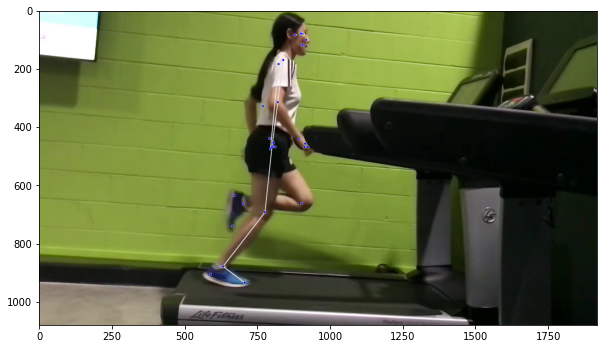

 48%|████▊     | 447/941.0 [00:18<00:16, 30.37it/s]

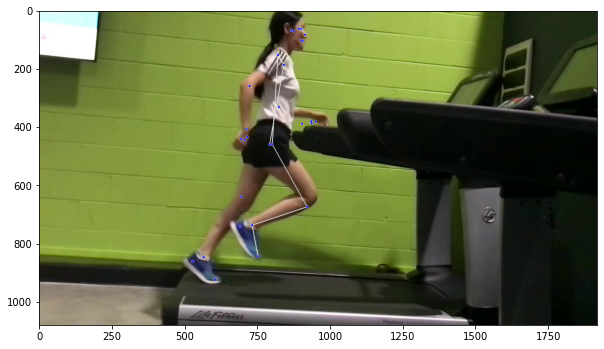

 53%|█████▎    | 500/941.0 [00:21<00:22, 19.97it/s]

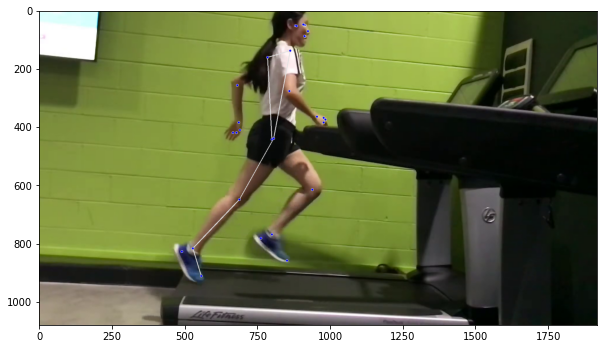

 58%|█████▊    | 550/941.0 [00:24<00:13, 28.65it/s]

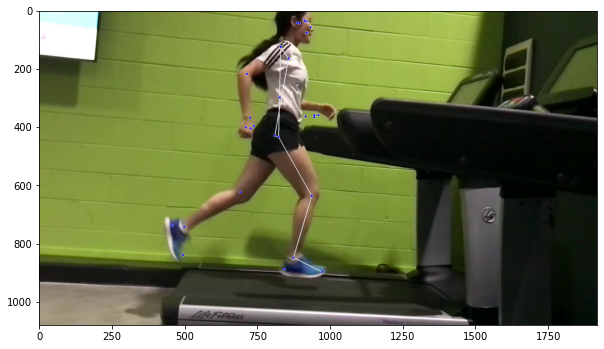

 64%|██████▎   | 599/941.0 [00:26<00:11, 29.32it/s]

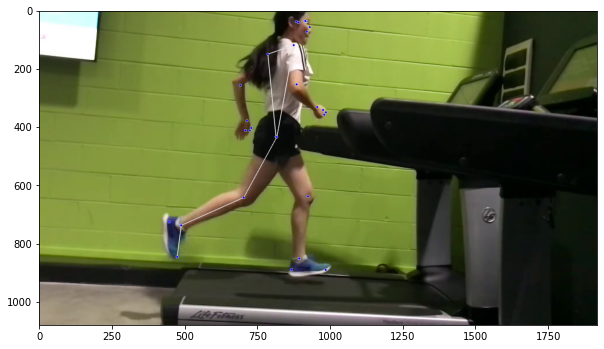

 69%|██████▉   | 648/941.0 [00:28<00:10, 28.92it/s]

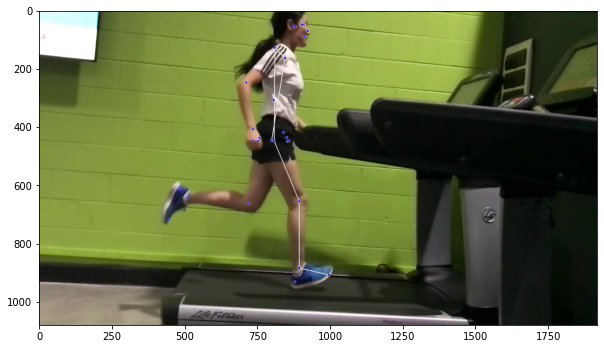

 74%|███████▍  | 699/941.0 [00:32<00:11, 20.53it/s]

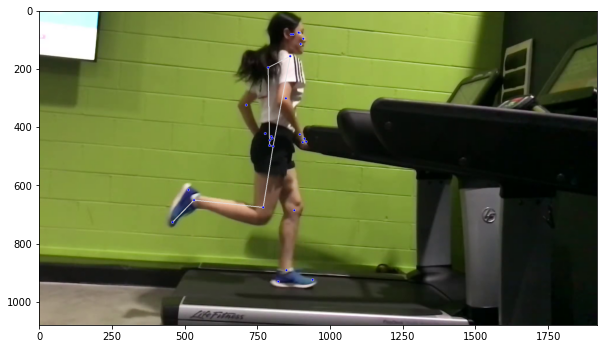

 80%|███████▉  | 750/941.0 [00:35<00:07, 26.28it/s]

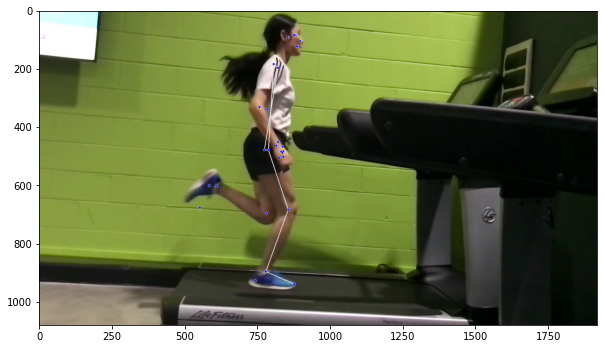

 85%|████████▍ | 798/941.0 [00:37<00:05, 26.47it/s]

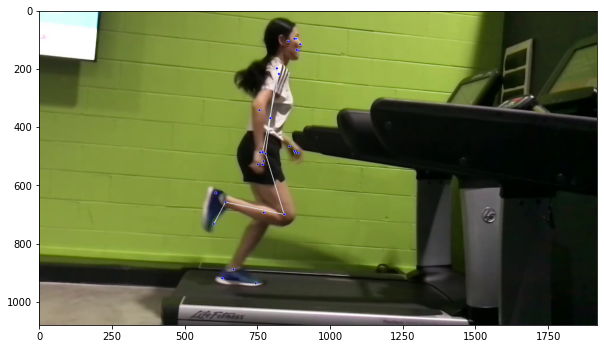

 90%|█████████ | 849/941.0 [00:39<00:03, 26.25it/s]

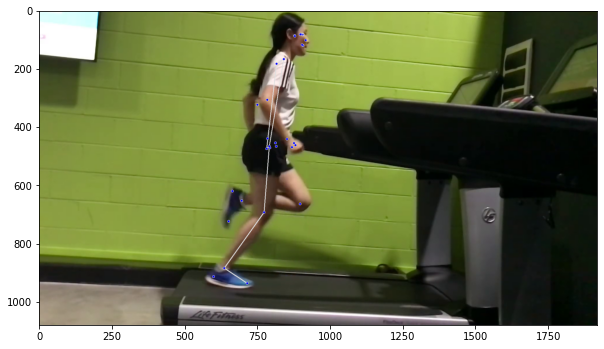

 96%|█████████▌| 899/941.0 [00:42<00:01, 24.77it/s]

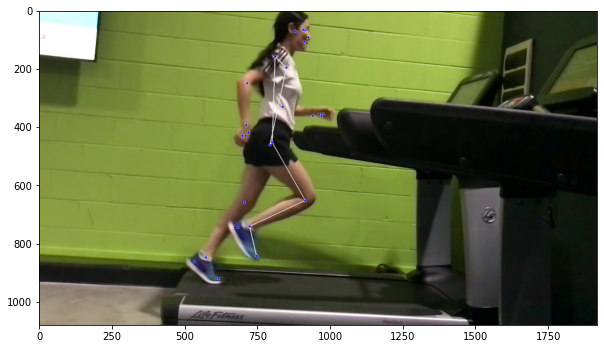

100%|██████████| 941/941.0 [00:44<00:00, 21.12it/s]


Failed to read the 941-th frame


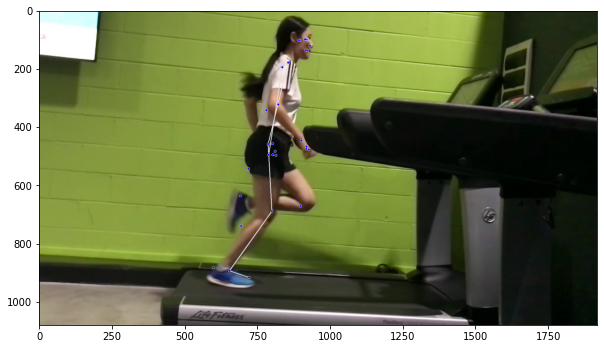

In [ ]:
if __name__ == '__main__':
  # If use_ksvd = True, it will use k-SVD algorithm to reproduce smooth estimated values, 
  # however, a considrable execution time, e.g., 17 minutes on Colab, is required.
  use_ksvd = True
  n_components = 200
  n_nonzero_coefs = 12
  max_iter=200 
  tol= 0.05
  improve_pose = ImprovePoseEst(video_fps, 
                                playback_speed = playback_speed,
                                thres = 0.9,
                                use_ksvd = use_ksvd,
                                n_components = n_components,
                                n_nonzero_coefs = n_nonzero_coefs, 
                                max_iter = max_iter, 
                                tol= tol
                                )
  df_ksvd = improve_pose(out_kps_csv_path + ".csv")

  ksvd_csv_file_path = video_path[:-4] + f"_ksvd_{n_components}_{n_nonzero_coefs}_{max_iter}_{tol}_" + direct
  out_ksvd_df = save_df(ksvd_csv_file_path, df_ksvd, direct_ind = direct_ind)

  out_ksvd_video_path = video_name + f'_ksvd_{n_components}_{n_nonzero_coefs}_{max_iter}_{tol}.mp4'
  improved_model = PoseVideo(video_path, out_ksvd_video_path, tracker_config = None)
  _ = improved_model(df_ksvd)

# Definition of lower limb joint angles
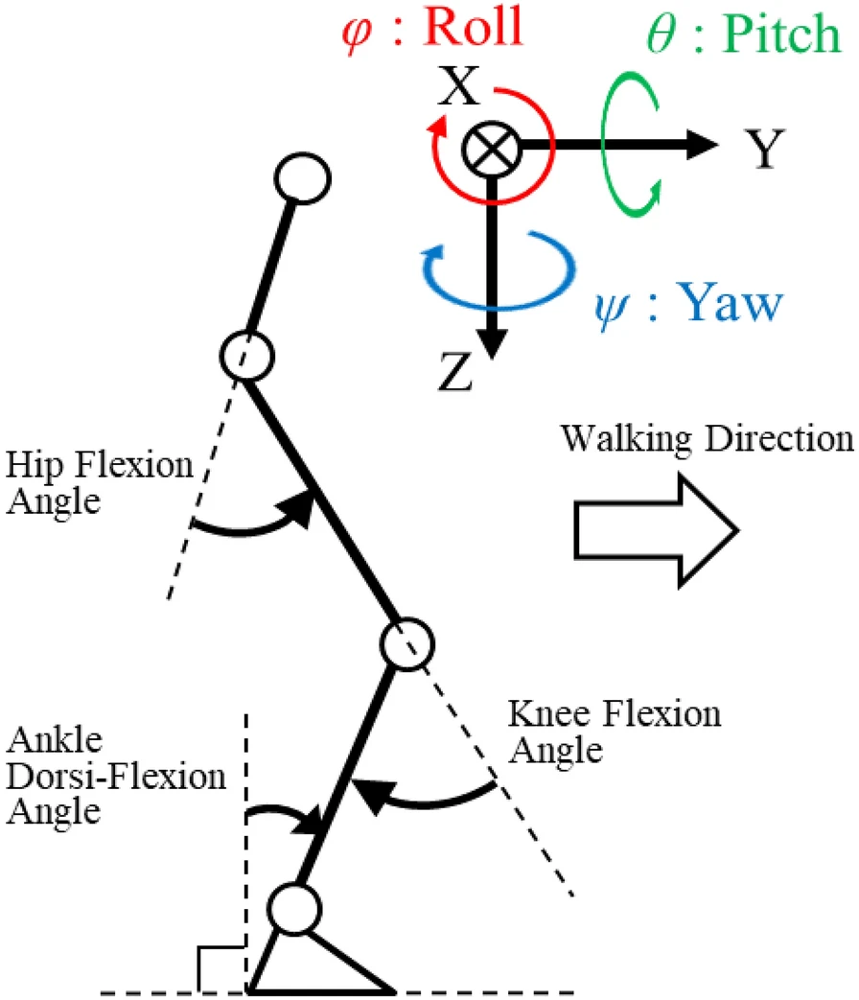

Ref: 
Saito, A., Kizawa, S., Kobayashi, Y. et al. Pose estimation by extended Kalman filter using noise covariance matrices based on sensor output. Robomech J 7, 36 (2020). 
https://doi.org/10.1186/s40648-020-00185-y \\
https://rdcu.be/cQWcP


# Values of Joint Angles are more accurate and reasonable after the improvement

In [ ]:
import matplotlib as mpl
mpl.rcParams["figure.figsize"] = [18.4, 8] #[16.4, 6.8]
#from matplotlib import pyplot as plt

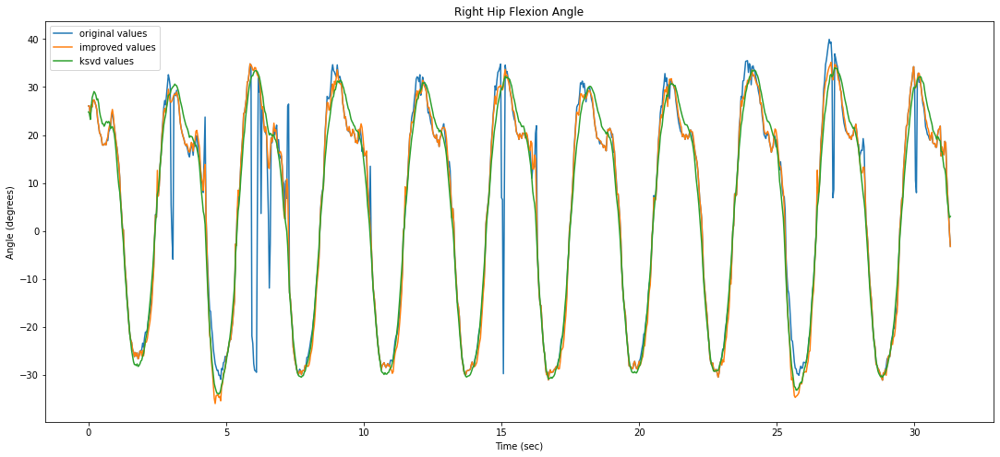

In [ ]:
feature = direct + " " + 'Hip Flexion Angle'
plt.plot(out_df["Time"], out_df[feature], label="original values")
plt.plot(out_reconst_df["Time"], out_reconst_df[feature], label="improved values")
if use_ksvd:
  plt.plot(out_ksvd_df["Time"], out_ksvd_df[feature], label="ksvd values")
plt.xlabel("Time (sec)")
plt.ylabel("Angle (degrees)")
plt.title(feature)
plt.legend()

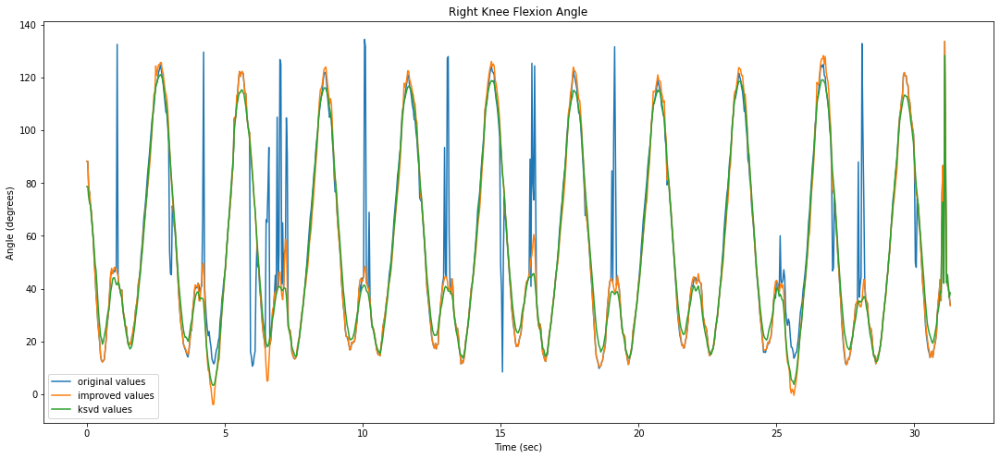

In [ ]:
feature = direct + " " + 'Knee Flexion Angle'
plt.plot(out_df["Time"], out_df[feature], label="original values")
plt.plot(out_reconst_df["Time"], out_reconst_df[feature], label="improved values")
if use_ksvd:
  plt.plot(out_ksvd_df["Time"], out_ksvd_df[feature], label="ksvd values")
plt.xlabel("Time (sec)")
plt.ylabel("Angle (degrees)")
plt.title(feature)
plt.legend()

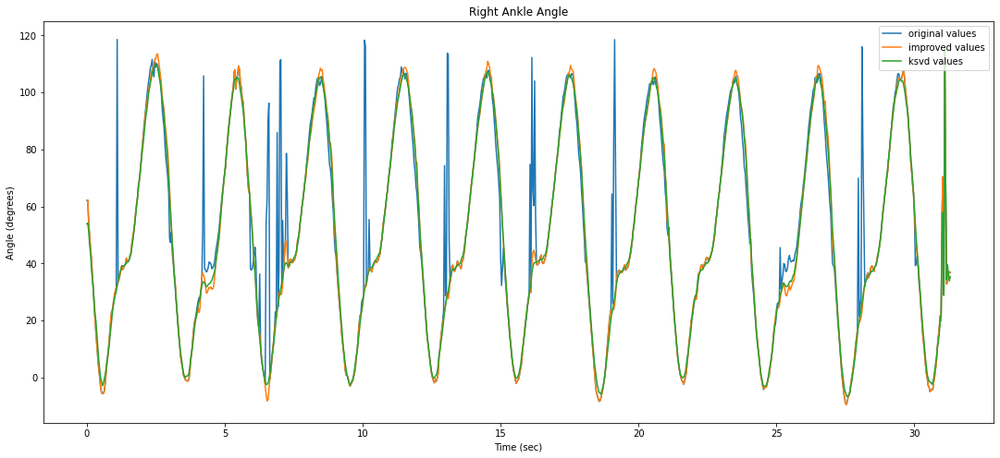

In [ ]:
feature = direct + " " + 'Ankle Angle'
plt.plot(out_df["Time"], out_df[feature], label="original values")
plt.plot(out_reconst_df["Time"], out_reconst_df[feature], label="improved values")
if use_ksvd:
  plt.plot(out_ksvd_df["Time"], out_ksvd_df[feature], label="ksvd values")
plt.xlabel("Time (sec)")
plt.ylabel("Angle (degrees)")
plt.title(feature)
plt.legend()

# Download overlay videos and processed estimation results to your computer

In [ ]:
from google.colab import files
files.download('/content/' + out_video_path)
files.download('/content/' + out_improved_video_path) 
files.download('/content/' + out_kps_csv_path + ".csv") 
files.download('/content/' + csv_file_path + ".csv") 
files.download('/content/' + reconst_csv_file_path + ".csv")
if use_ksvd:
  files.download('/content/' + out_ksvd_video_path)
  files.download('/content/' + ksvd_csv_file_path + ".csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>